In [1]:
import l2f_tda as tda

import numpy as np
import pandas as pd
import datetime as dt

import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()
%matplotlib inline

import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)

Using TensorFlow backend.


In [2]:
initialConditions = (1, -10, 10)
sigma, beta = 1.0*10, 1.0*8./3.
rhoMin, rhoMax = 5, 15
transitionList, numberTransitions, transitionDuration = None, 25, 100
timeStep, maxDuration = 0.01, 50000
meanNoise, stdDeviationNoise = 0., 0.

lorenzAttractor = tda.LorenzDataset(initialConditions, sigma, beta, rhoMin, rhoMax,
                     transitionList, numberTransitions, transitionDuration,
                     timeStep, maxDuration, meanNoise, stdDeviationNoise)
lorenzAttractor.run()
lorenzAttractor.plot()

50 [0.0335, 0.0645, 0.08499999999999999, 0.095, 0.10400000000000001, 0.1105, 0.1325, 0.171, 0.1845, 0.20800000000000002, 0.21750000000000003, 0.2625, 0.2655, 0.281, 0.28800000000000003, 0.3145, 0.34400000000000003, 0.352, 0.3785, 0.41500000000000004, 0.4165, 0.4505, 0.4635, 0.49050000000000005, 0.5035, 0.508, 0.526, 0.5755, 0.59, 0.5970000000000001, 0.613, 0.635, 0.6555, 0.7030000000000001, 0.7124999999999999, 0.7245, 0.726, 0.7525, 0.764, 0.808, 0.8215, 0.8684999999999999, 0.88, 0.8835, 0.921, 0.9265, 0.927, 0.987, 0.996, 1.0085]


In [3]:
z = lorenzAttractor.z
rho = lorenzAttractor.rho
regime = lorenzAttractor.regime

In [4]:
zDataFrame = pd.DataFrame(z)
rhoDataFrame = pd.DataFrame(rho)
regimeDataFrame = pd.DataFrame(regime)
index = pd.to_datetime(zDataFrame.index, utc=True, unit='h')
zDataFrame.index = index
rhoDataFrame.index = index
regimeDataFrame.index = index
print(zDataFrame.head()), print(regimeDataFrame.head()) 

                                   0
1970-01-01 00:00:00+00:00  10.000000
1970-01-01 01:00:00+00:00   9.633333
1970-01-01 02:00:00+00:00   9.386394
1970-01-01 03:00:00+00:00   9.242918
1970-01-01 04:00:00+00:00   9.186662
                           0  1
1970-01-01 00:00:00+00:00  0  0
1970-01-01 01:00:00+00:00  0  0
1970-01-01 02:00:00+00:00  0  0
1970-01-01 03:00:00+00:00  0  0
1970-01-01 04:00:00+00:00  0  0


(None, None)

In [5]:
X = pd.concat([zDataFrame, regimeDataFrame], axis = 1)

(50000, 1)


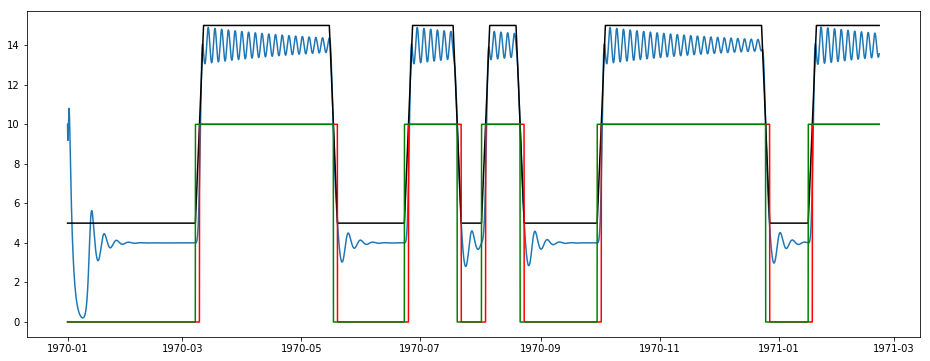

In [7]:
fig = plt.figure(figsize=(16,6))

plt.plot(zDataFrame[:10000])
plt.plot(rhoDataFrame[:10000], color='k')
plt.plot(10*regimeDataFrame[:10000][0], color='r')
plt.plot(10*regimeDataFrame[:10000][1], color='g')

print(zDataFrame.shape)

In [15]:
import pickle as pkl
pkl.dump(zDataFrame, open('example_time_series.pkl', 'wb'))
pkl.dump(regimeDataFrame, open('example_regime.pkl', 'wb'))

In [22]:
samplingTimeList = [dt.time(0,0,0),dt.time(6,0,0),dt.time(12,0,0),dt.time(18,0,0)]
fixedSampler = tda.Sampler(samplingType='fixed', samplingTimeList=samplingTimeList, removeWeekends=False)

In [23]:
fixedSampler.fit(X)
zDataFrameSampled = fixedSampler.transform(X)[0]
regimeDataFrameSampled = fixedSampler.transform(X)[1]
print(zDataFrameSampled.head()), print(regimeDataFrameSampled.head())

                                   0  0
1970-01-01 00:00:00+00:00  10.000000  0
1970-01-01 06:00:00+00:00   9.274441  0
1970-01-01 12:00:00+00:00  10.228243  0
1970-01-01 18:00:00+00:00  10.807765  0
1970-01-02 00:00:00+00:00  10.389529  0
1970-01-01 00:00:00+00:00    0
1970-01-01 06:00:00+00:00    0
1970-01-01 12:00:00+00:00    0
1970-01-01 18:00:00+00:00    0
1970-01-02 00:00:00+00:00    0
Name: 1, dtype: int8


(None, None)

(50000, 1) (8334, 1)


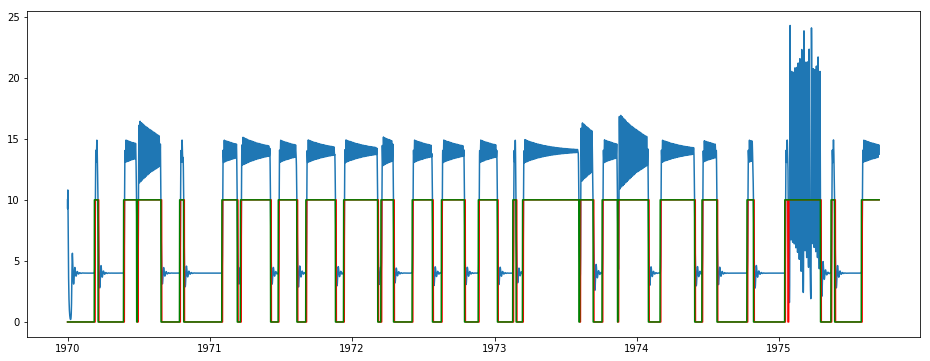

In [18]:
fig = plt.figure(figsize=(16,6))

plt.plot(zDataFrameSampled)
plt.plot(10*regimeDataFrameSampled[0], color='r')
plt.plot(10*regimeDataFrameSampled[1], color='g')
print(zDataFrame.shape, zDataFrameSampled.shape)

In [10]:
samplingPeriod = '2h'
periodicSampler = tda.Sampler(samplingType='periodic', samplingPeriod=samplingPeriod, removeWeekends=False)

In [25]:
periodicSampler.fit(X)
zDataFrameSampled = periodicSampler.transform(X)[0]
regimeDataFrameSampled = periodicSampler.transform(X)[1]
print(zDataFrameSampled.head()), print(regimeDataFrameSampled.head())

                                   0  0
1970-01-01 00:00:00+00:00  10.000000  0
1970-01-01 02:00:00+00:00   9.386394  0
1970-01-01 04:00:00+00:00   9.186662  0
1970-01-01 06:00:00+00:00   9.274441  0
1970-01-01 08:00:00+00:00   9.537337  0
1970-01-01 00:00:00+00:00    0
1970-01-01 02:00:00+00:00    0
1970-01-01 04:00:00+00:00    0
1970-01-01 06:00:00+00:00    0
1970-01-01 08:00:00+00:00    0
Freq: 2H, Name: 1, dtype: int8


(None, None)

(50000, 1) (25000, 1)


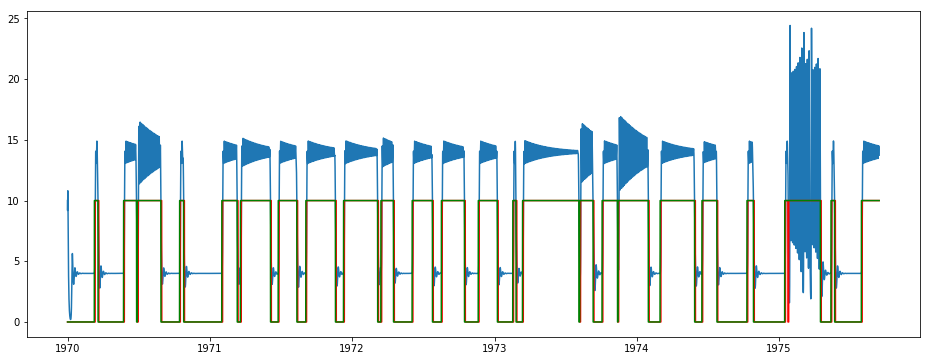

In [12]:
fig = plt.figure(figsize=(16,6))

plt.plot(zDataFrameSampled)
plt.plot(10*regimeDataFrameSampled[0], color='r')
plt.plot(10*regimeDataFrameSampled[1], color='g')
print(zDataFrame.shape, zDataFrameSampled.shape)

In [14]:
import pickle as pkl
pkl.dump(sampled_zDataFrame, open('example_sampled_time_series.pkl', 'wb'))
pkl.dump(sampled_regimeDataFrame, open('example_sampled_regime.pkl', 'wb'))

In [1]:
mylist = [1,2,0]

In [9]:
import numpy as np

x = np.array([1, 2, 4, 7, 0])
x_1 = np.diff(x)

x_2 = np.diff(x, n=2)

In [13]:
print(x)
print()
print(x[2:])
print(x_1[1:])
print(x_2)

[1 2 4 7 0]

[4 7 0]
[ 2  3 -7]
[  1   1 -10]
